<a id="TOP"> </a>
<div class="alert alert-box alert-info">
</div>

***

# EXPLORE

In [1]:
import pandas as pd
import numpy as np
from IPython.display import display, Markdown, Latex

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from wrangle import clean_zillow, summarize, split_data_continuous
from viz import get_viz

import warnings
warnings.filterwarnings("ignore")

In [2]:
get_viz()


from viz import boxplots, hists, heatmaps, slicer, haversine
        


In [3]:
from viz import boxplots, hists, heatmaps, slicer, haversine

In [4]:
df = clean_zillow()

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41067 entries, 0 to 41066
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    41067 non-null  int64  
 1   parcel                41067 non-null  int64  
 2   logerror              41067 non-null  float64
 3   bathrooms             41067 non-null  object 
 4   bedrooms              41067 non-null  object 
 5   tot_sqft              41067 non-null  float64
 6   fips                  41067 non-null  object 
 7   hot_tub               41067 non-null  float64
 8   lat                   41067 non-null  float64
 9   lon                   41067 non-null  float64
 10  lot_sqft              41067 non-null  float64
 11  pools                 41067 non-null  int64  
 12  county_landuse        41067 non-null  object 
 13  raw_tract_and_block   41067 non-null  float64
 14  city_id               41067 non-null  object 
 15  zip_code           

In [5]:
train, validate, test = split_data_continuous(df, with_baseline=True, target='rsle')

Prepared df: (41067, 25)

Train: (24639, 25)
Validate: (8214, 25)
Test: (8214, 25)
The mean_preds had the lowest RMSE: 447296 with an in/out of: 1.018


In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24639 entries, 22185 to 21732
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    24639 non-null  int64  
 1   parcel                24639 non-null  int64  
 2   logerror              24639 non-null  float64
 3   bathrooms             24639 non-null  object 
 4   bedrooms              24639 non-null  object 
 5   tot_sqft              24639 non-null  float64
 6   fips                  24639 non-null  object 
 7   hot_tub               24639 non-null  float64
 8   lat                   24639 non-null  float64
 9   lon                   24639 non-null  float64
 10  lot_sqft              24639 non-null  float64
 11  pools                 24639 non-null  int64  
 12  county_landuse        24639 non-null  object 
 13  raw_tract_and_block   24639 non-null  float64
 14  city_id               24639 non-null  object 
 15  zip_code       

In [8]:
num_vars = []
for i in df:
    if df[i].dtype != 'O':
        num_vars.append(i)
num_vars

['id',
 'parcel',
 'logerror',
 'tot_sqft',
 'hot_tub',
 'lat',
 'lon',
 'lot_sqft',
 'pools',
 'raw_tract_and_block',
 'building_tax_value',
 'tax_value',
 'land_tax_value',
 'tax_amount',
 'tax_delinquency_flag',
 'tract_and_block',
 'half_baths',
 'house_age',
 'rsle']

In [9]:
cat_vars = []
for i in df:
    if i not in num_vars:
        cat_vars.append(i)
# cat_vars.append('trans_date')

In [10]:
cat_vars

['bathrooms', 'bedrooms', 'fips', 'county_landuse', 'city_id', 'zip_code']

In [8]:
# num_vars.remove('trans_date')

In [11]:
df[num_vars].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41067 entries, 0 to 41066
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    41067 non-null  int64  
 1   parcel                41067 non-null  int64  
 2   logerror              41067 non-null  float64
 3   tot_sqft              41067 non-null  float64
 4   hot_tub               41067 non-null  float64
 5   lat                   41067 non-null  float64
 6   lon                   41067 non-null  float64
 7   lot_sqft              41067 non-null  float64
 8   pools                 41067 non-null  int64  
 9   raw_tract_and_block   41067 non-null  float64
 10  building_tax_value    41067 non-null  float64
 11  tax_value             41067 non-null  float64
 12  land_tax_value        41067 non-null  float64
 13  tax_amount            41067 non-null  float64
 14  tax_delinquency_flag  41067 non-null  int64  
 15  tract_and_block    

In [23]:
df['tax_rate'] = df.tax_amount/df.tax_value

In [25]:
df = df.drop(columns= ['tax_amount', 'tax_value'])

In [28]:
df['acres'] = df.lot_sqft/ 43560
df = df.drop(columns='lot_sqft')

In [29]:
df['structure_dollar_per_sqft'] = df.building_tax_value / df.tot_sqft

df = df.drop(columns= ['building_tax_value', 'tot_sqft'])

In [31]:
df['land_dollar_per_acre'] = df.land_tax_value / df.acres

df= df.drop(columns= 'land_tax_value')

In [33]:
df.bedrooms.unique()

array(['_4_', '_2_', '_3_', '_5_'], dtype=object)

In [36]:
df.bedrooms = df.bedrooms.map({'_4_':4, '_3_':3, '_2_': 2, '_5_': 5})

In [38]:
df.bathrooms.unique()

array(['_4_', '_1_', '_2_', '_3_', '_5_'], dtype=object)

In [39]:
df.bathrooms = df.bathrooms.map({'_4_':4, '_3_':3, '_2_': 2, '_5_': 5, '_1_':1})

In [41]:
df['bed_bath_ratio'] = df.bedrooms/ df.bathrooms

In [42]:
df= df.drop(columns=['bedrooms','bathrooms'])

In [43]:
df['incity_la'] = df.city_id.apply(lambda x: 1 if x == 12447 else 0)

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41067 entries, 0 to 41066
Data columns (total 23 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   id                         41067 non-null  int64  
 1   parcel                     41067 non-null  int64  
 2   logerror                   41067 non-null  float64
 3   fips                       41067 non-null  object 
 4   hot_tub                    41067 non-null  float64
 5   lat                        41067 non-null  float64
 6   lon                        41067 non-null  float64
 7   pools                      41067 non-null  int64  
 8   county_landuse             41067 non-null  object 
 9   raw_tract_and_block        41067 non-null  float64
 10  city_id                    41067 non-null  object 
 11  zip_code                   41067 non-null  object 
 12  tax_delinquency_flag       41067 non-null  int64  
 13  tract_and_block            41067 non-null  int

In [48]:
fips = pd.get_dummies(df.fips)

In [53]:
df = pd.concat([df, fips], axis=1)

In [54]:
df = df.drop(columns='fips')

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41067 entries, 0 to 41066
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   id                         41067 non-null  int64  
 1   parcel                     41067 non-null  int64  
 2   logerror                   41067 non-null  float64
 3   hot_tub                    41067 non-null  float64
 4   lat                        41067 non-null  float64
 5   lon                        41067 non-null  float64
 6   pools                      41067 non-null  int64  
 7   county_landuse             41067 non-null  object 
 8   raw_tract_and_block        41067 non-null  float64
 9   city_id                    41067 non-null  object 
 10  zip_code                   41067 non-null  object 
 11  tax_delinquency_flag       41067 non-null  int64  
 12  tract_and_block            41067 non-null  int64  
 13  half_baths                 41067 non-null  int

In [57]:
df = df.drop(columns= ['city_id', 'zip_code', 'county_landuse', 'tract_and_block', 'rsle', 'half_baths'])

In [59]:
df = df.drop(columns= ['id', 'parcel'])

In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41067 entries, 0 to 41066
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   logerror                   41067 non-null  float64
 1   hot_tub                    41067 non-null  float64
 2   lat                        41067 non-null  float64
 3   lon                        41067 non-null  float64
 4   pools                      41067 non-null  int64  
 5   raw_tract_and_block        41067 non-null  float64
 6   tax_delinquency_flag       41067 non-null  int64  
 7   house_age                  41067 non-null  int64  
 8   tax_rate                   41067 non-null  float64
 9   acres                      41067 non-null  float64
 10  structure_dollar_per_sqft  41067 non-null  float64
 11  land_dollar_per_acre       41067 non-null  float64
 12  bed_bath_ratio             41067 non-null  float64
 13  incity_la                  41067 non-null  int

In [62]:
df = df.drop(columns='raw_tract_and_block')

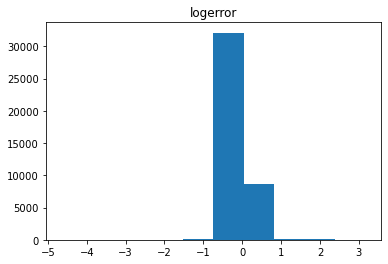

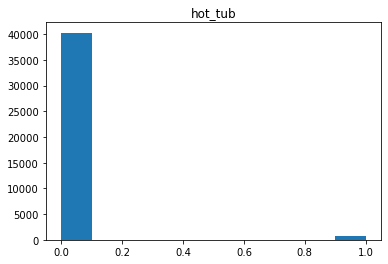

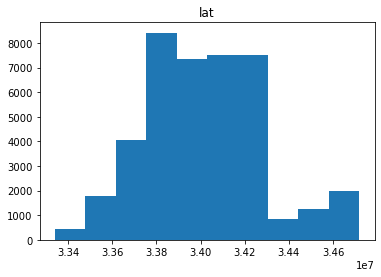

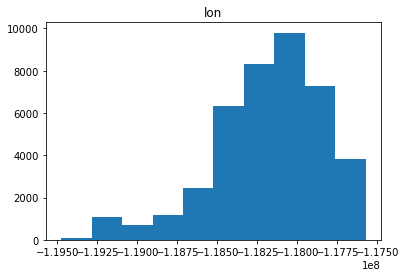

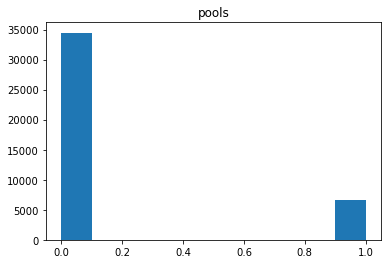

...

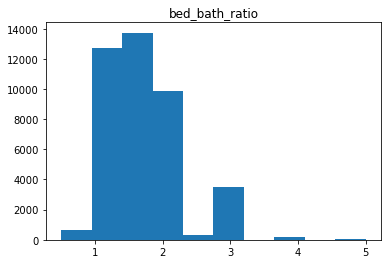

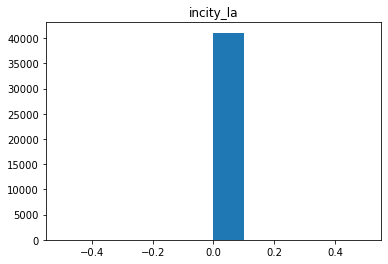

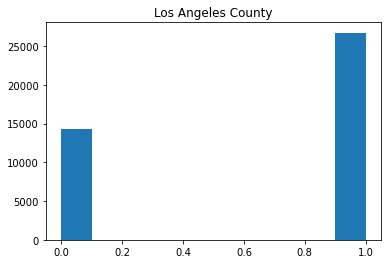

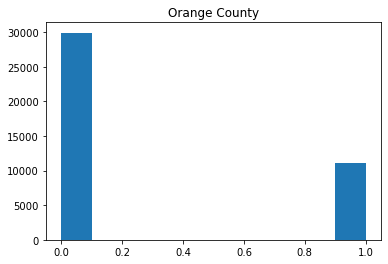

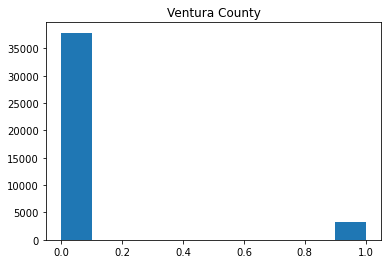

In [63]:
for col in df.columns:
    plt.hist(df[col])
    plt.title(col)
    plt.show()

In [64]:
train, validate, test = split_data_continuous(df, target='logerror')
                                    

Prepared df: (41067, 16)

Train: (24639, 16)
Validate: (8214, 16)
Test: (8214, 16)


In [69]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24639 entries, 22185 to 21732
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   logerror                   24639 non-null  float64
 1   hot_tub                    24639 non-null  float64
 2   lat                        24639 non-null  float64
 3   lon                        24639 non-null  float64
 4   pools                      24639 non-null  int64  
 5   tax_delinquency_flag       24639 non-null  int64  
 6   house_age                  24639 non-null  int64  
 7   tax_rate                   24639 non-null  float64
 8   acres                      24639 non-null  float64
 9   structure_dollar_per_sqft  24639 non-null  float64
 10  land_dollar_per_acre       24639 non-null  float64
 11  bed_bath_ratio             24639 non-null  float64
 12  incity_la                  24639 non-null  int64  
 13  Los Angeles County         24639 non-null 

In [70]:
X_train = train.drop(columns='logerror')
y_train = train.logerror
X_validate = validate.drop(columns= 'logerror')
y_validate = validate.logerror
X_test = test.drop(columns= 'logerror')
y_test = test.logerror

# How does the acreage affect logerror?

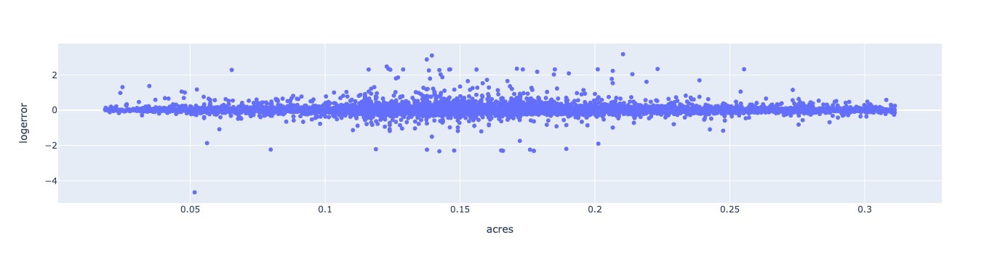

In [75]:
px.scatter(data_frame=train,
                x= train.acres,
                y= 'logerror',
           # marginal_x='box'
               )


In [77]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24639 entries, 22185 to 21732
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   logerror                   24639 non-null  float64
 1   hot_tub                    24639 non-null  float64
 2   lat                        24639 non-null  float64
 3   lon                        24639 non-null  float64
 4   pools                      24639 non-null  int64  
 5   tax_delinquency_flag       24639 non-null  int64  
 6   house_age                  24639 non-null  int64  
 7   tax_rate                   24639 non-null  float64
 8   acres                      24639 non-null  float64
 9   structure_dollar_per_sqft  24639 non-null  float64
 10  land_dollar_per_acre       24639 non-null  float64
 11  bed_bath_ratio             24639 non-null  float64
 12  incity_la                  24639 non-null  int64  
 13  Los Angeles County         24639 non-null 

# Is there a relationship between tax rate and logerror... and are hot tubs different?

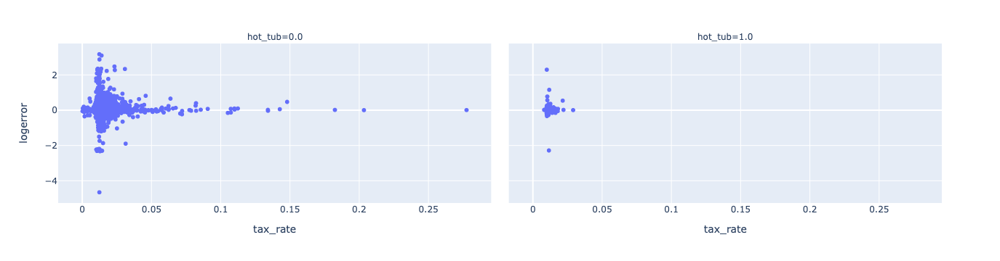

In [80]:
px.scatter(data_frame=train,
                x= train.tax_rate,
                y= 'logerror',
           # facet_col='fips',
           facet_col= train.hot_tub
               )


# It looks like the higher the Tax Rate, the less the logerror
- We will test this

- Also it looks like houses with hot tubs are taxed at a lower rate

In [82]:
from scipy.stats import pearsonr, spearmanr

In [83]:
r, p_value = pearsonr(x= train.tax_rate, y= train.logerror)
print(r, p_value)

0.016449963729742823 0.009818289680690907


In [84]:
α = .05

In [87]:
if p_value < α:
    print(f'We can REJECT the Null Hₒ: There is no correlation between Tax Rate and Logerror\nWith Correlation coeffiecent of {round(r,2)} and p_value of {round(p_value,3)}')
    
else:
    print('We CANNOT reject thr Null Hₒ: There is no correlation between Tax Rate and Logerror')

We can REJECT the Null Hₒ: There is no correlation between Tax Rate and Logerror
With Correlation coeffiecent of 0.02 and p_value of 0.01


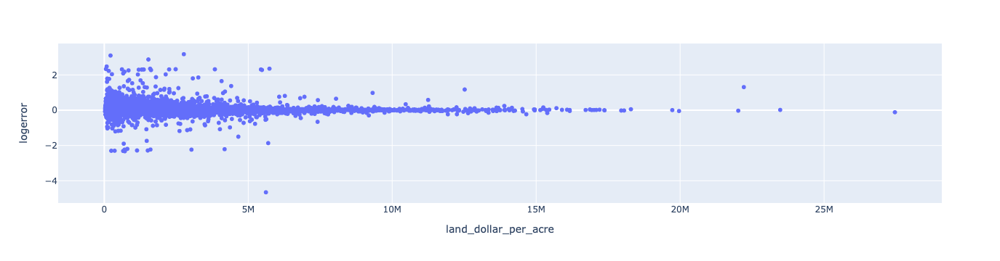

In [81]:
px.scatter(data_frame=train,
           x= 'land_dollar_per_acre',
           y= 'logerror',
           # color= 'fips'
          )

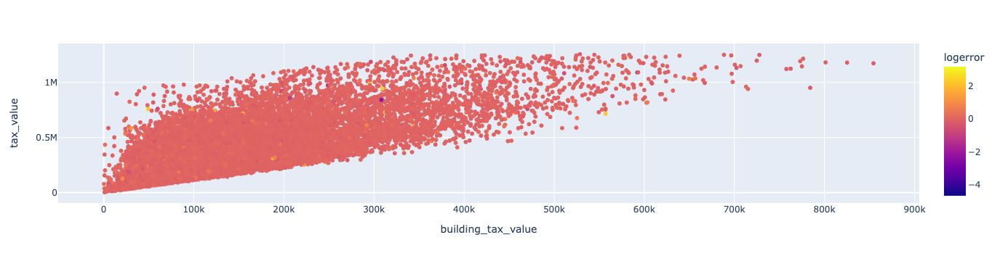

In [21]:
px.scatter(data_frame=train,
           x= 'building_tax_value',
           y= 'tax_value',
           color= 'logerror')

# If building tax value goes up with tax value we don't need both

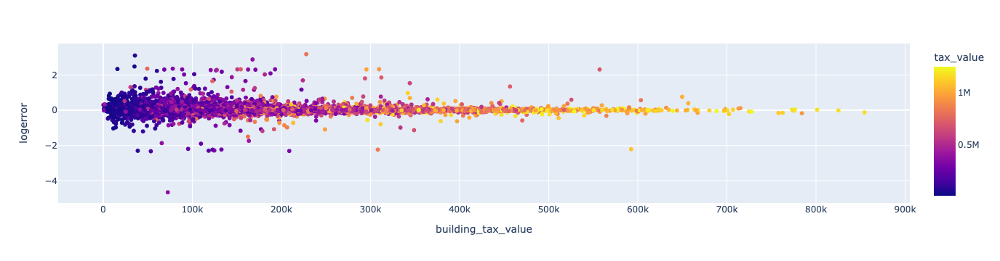

In [22]:
px.scatter(data_frame=train,
           x= 'building_tax_value',
           y= 'logerror',
           color= 'tax_value')